In [21]:
# pip install laspy
# pip install --upgrade lasio
# pip install pandas_profiling --upgrade

In [22]:
import pandas as pd
import numpy as np
import lasio
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import pandas_profiling

#### Function to Load the las file

In [23]:
def load_las_file(filename):
    log = lasio.read(filename)   # read las file
    log = log.df()  #convert to a dataframe using df() function
#     log = log.dropna() #drop empty or null cells 
    return log

#### Function to Display and analyse missing data 

In [24]:
def missing_check(df):
    total = df.isnull().sum().sort_values(ascending=False)   # total number of null values
    percent = (100*(df.isnull().sum()/df.isnull().count())).sort_values(ascending=False)  # percentage of values that are null
    missing_data = pd.concat([total, percent], axis=1, keys=['Total missing', 'Percent'])  # putting the above two together
    return missing_data # return the dataframe

#### Function to clean the data and drop all missing rows 

In [36]:
def drop_missing_data(df):
#     col_miss = df.dropna(axis=1) #drop colums with missing data
    row_miss = df.dropna()
    return row_miss

#### Function to display the general statistics of the table

In [26]:
def statistical_summary(df):
    return df.describe().transpose()

#### Function for Visual analysis of the univariate distribution plots for each log

In [49]:
def distribution_plot(df,color = 'b'):
    fig = plt.figure(figsize=[15,15],dpi=100)
    fig.subplots_adjust(hspace=0.35, wspace=0.35)
    columns = df.columns.tolist()
    j=1
    for i in columns:
        ax = fig.add_subplot(5,3,j)
        sns.distplot(df[i], ax=ax, kde =True, color = color)
        j=j+1
        if j>len(columns):
            break
    plt.show()

#### Function for visual identification of potential outliers 

In [53]:
def outliers(df,color = 'b'):
    fig = plt.figure(figsize=[15,15],dpi=100)
    fig.subplots_adjust(hspace=0.25, wspace=0.25)
    columns = df.columns.tolist()
    j=1
    for i in columns:
        ax = fig.add_subplot(5,3,j)
        sns.boxplot(df[i], ax=ax, color = color)
        j=j+1
        if j>len(columns):
            break
    plt.show()

#### Pairplot for bivariate analysis

In [29]:
def bivariate(df):
    sns.pairplot(df)#, kind="reg")  # plots scatter plots for every pair of attributes and histograms along the diagonal
    plt.show()

In [30]:
m = load_las_file(r'C1-12X_C1-12X.las')
m

,FIS_ACETICACD_1,FIS_ALKNAPHTH_1,FIS_BENZENE_1,FIS_C2H6_1,FIS_CH4_1,FIS_CS2PLUSHCS_1,FIS_PARAFINS57_1,FIS_SAMPLING_1,FIS_TOTAL_HC_1,GR_1,LITHO_PETREL_1,MD_1,NPHI_1,RHOB_1,TVD_1
DEPTH,,,,,,,,,,,,,,,
0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,NaN,NaN,0.0000
0.1524,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1524,NaN,NaN,0.1524
0.2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2000,NaN,NaN,0.2000
0.3048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3048,NaN,NaN,0.3048
0.4000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4000,NaN,NaN,0.4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2992.5264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.291,NaN,NaN,NaN,NaN,NaN
2992.6788,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.491,NaN,NaN,NaN,NaN,NaN
2992.8312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.691,NaN,NaN,NaN,NaN,NaN


#### Analysis of Missing Data

In [31]:
table = missing_check(m)
table

,Total missing,Percent
NPHI_1,23160,65.629516
RHOB_1,23160,65.629516
GR_1,19694,55.807759
LITHO_PETREL_1,19679,55.765253
FIS_SAMPLING_1,5411,15.333390
FIS_ACETICACD_1,5306,15.035847
FIS_ALKNAPHTH_1,5306,15.035847
FIS_BENZENE_1,5306,15.035847
FIS_C2H6_1,5306,15.035847
FIS_CH4_1,5306,15.035847


#### Histogram of relative percentage of missing data per log 

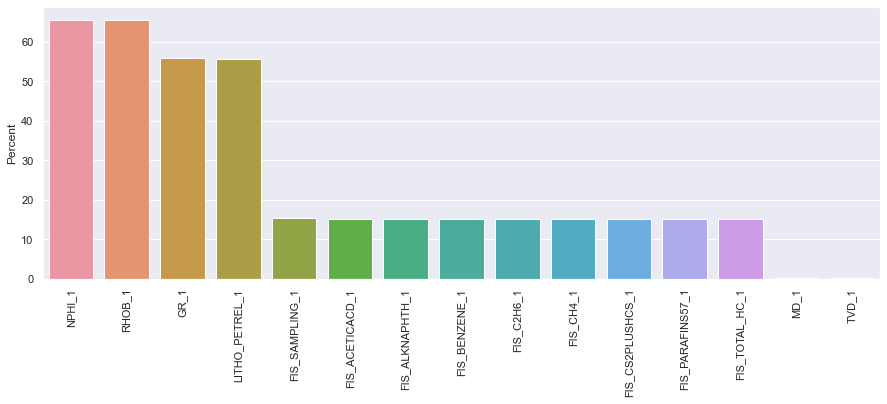

In [32]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x=table.index, y='Percent', data=table)
plt.xticks(rotation=90);

#### Histogram of relative amount of data points missing per log

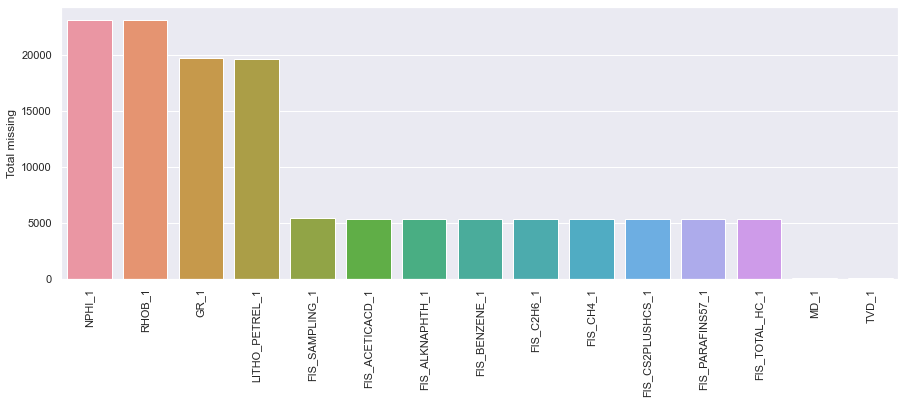

In [33]:
plt.figure(figsize=(15,5))
ax2 = sns.barplot(x=table.index, y='Total missing', data=table)
plt.xticks(rotation=90);

#### drop all rows that have missing data

In [38]:
l= drop_missing_data(m)
l  # data rows reduces to 12064

,FIS_ACETICACD_1,FIS_ALKNAPHTH_1,FIS_BENZENE_1,FIS_C2H6_1,FIS_CH4_1,FIS_CS2PLUSHCS_1,FIS_PARAFINS57_1,FIS_SAMPLING_1,FIS_TOTAL_HC_1,GR_1,LITHO_PETREL_1,MD_1,NPHI_1,RHOB_1,TVD_1
DEPTH,,,,,,,,,,,,,,,
1981.20000,507.80000,265.00000,168.30000,1348.00000,58610.00000,18.69000,3859.00000,1.0,65207.11049,56.58400,39.19266,1981.20000,0.34140,2.17400,1981.20000
1981.20003,507.80043,264.99916,168.29998,1348.00035,58610.02228,18.69136,3859.00559,1.0,65207.13979,56.58380,39.19266,1981.20003,0.34140,2.17400,1981.20003
1981.35240,510.03167,260.68837,168.20000,1349.81667,58725.00000,25.70850,3887.85000,1.0,65358.38310,55.55550,39.20092,1981.35240,0.34950,2.19100,1981.35240
1981.40003,510.72913,259.34085,168.16875,1350.38443,58760.94091,27.90199,3896.86648,1.0,65405.66028,55.23406,39.20349,1981.40003,0.35203,2.19631,1981.40003
1981.50480,512.26333,256.37673,168.10000,1351.63333,58840.00000,32.72700,3916.70000,1.0,65509.65571,54.52700,39.20917,1981.50480,0.35760,2.20800,1981.50480
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2981.40004,213.79525,61.18478,46.73770,1076.20629,252546.85412,290.16431,10987.32014,1.0,262987.79294,45.99124,34.18949,2981.40004,0.15615,2.57690,2981.40004
2981.40120,213.81500,61.15750,46.72300,1076.56107,252602.25000,290.26000,10987.25000,1.0,263044.42869,45.99200,34.20433,2981.40120,0.15620,2.57650,2981.40120
2981.55360,216.42000,57.56000,44.78400,1123.35160,259908.00000,302.88000,10978.00000,1.0,270513.69598,46.09200,36.16189,2981.55360,0.16250,2.52400,2981.55360


#### General Statistics 

In [39]:
stat = statistical_summary(m)  #using uncleaned data 
stat

,count,mean,std,min,25%,50%,75%,max
FIS_ACETICACD_1,29983.0,516.668440,193.014504,23.3700,385.567000,502.38000,616.315620,1291.00000
FIS_ALKNAPHTH_1,29983.0,94.123675,86.871264,0.0000,34.278825,72.14030,125.053085,658.50000
FIS_BENZENE_1,29983.0,160.403364,99.656785,0.0000,95.659630,142.65000,200.106770,798.30000
FIS_C2H6_1,29983.0,1413.090645,736.481848,0.0000,970.784165,1189.50000,1574.298335,10190.00000
FIS_CH4_1,29983.0,84842.103693,98594.870797,12920.0000,31244.042180,42432.00000,78515.000000,929600.00000
FIS_CS2PLUSHCS_1,29983.0,306.115519,745.162668,0.0000,85.346560,180.62500,305.643465,13110.00000
FIS_PARAFINS57_1,29983.0,6972.142162,6144.885229,0.0000,3980.394185,4918.81667,7681.850780,82260.00000
FIS_SAMPLING_1,29878.0,1.000000,0.000000,1.0000,1.000000,1.00000,1.000000,1.00000
FIS_TOTAL_HC_1,29983.0,94723.792100,101827.387649,20686.8800,38055.430185,51374.63338,91263.743305,954352.00000
GR_1,15595.0,47.658735,13.428064,19.2150,36.669545,46.00000,55.152135,96.93900


In [41]:
stat1 = statistical_summary(l) #Using cleaned data (with missing rows dropped)
stat1

,count,mean,std,min,25%,50%,75%,max
FIS_ACETICACD_1,12064.0,513.813297,221.246290,23.3700,344.475000,516.007500,649.890000,1244.0000
FIS_ALKNAPHTH_1,12064.0,137.080435,108.834114,0.0000,52.650948,113.439325,199.990393,658.5000
FIS_BENZENE_1,12064.0,202.104798,120.238456,0.0000,116.032748,185.598680,276.289437,798.3000
FIS_C2H6_1,12064.0,1877.977495,936.737921,0.0000,1215.237500,1683.250000,2312.044485,10190.0000
FIS_CH4_1,12064.0,154380.755089,124539.030601,18210.0000,57905.987302,118018.500580,214998.717020,929600.0000
FIS_CS2PLUSHCS_1,12064.0,225.596441,215.406345,0.0000,73.881937,179.018535,306.746993,1897.0000
FIS_PARAFINS57_1,12064.0,10976.916159,8061.200220,0.0000,6425.450000,8587.896235,12547.777782,82260.0000
FIS_SAMPLING_1,12064.0,1.000000,0.000000,1.0000,1.000000,1.000000,1.000000,1.0000
FIS_TOTAL_HC_1,12064.0,168936.653326,126398.066034,20686.8800,70794.695583,130553.762045,229985.640015,954352.0000
GR_1,12064.0,42.261006,8.896093,19.2150,35.298282,41.160905,48.866625,80.2060


#### Univariate distribution analysis per log

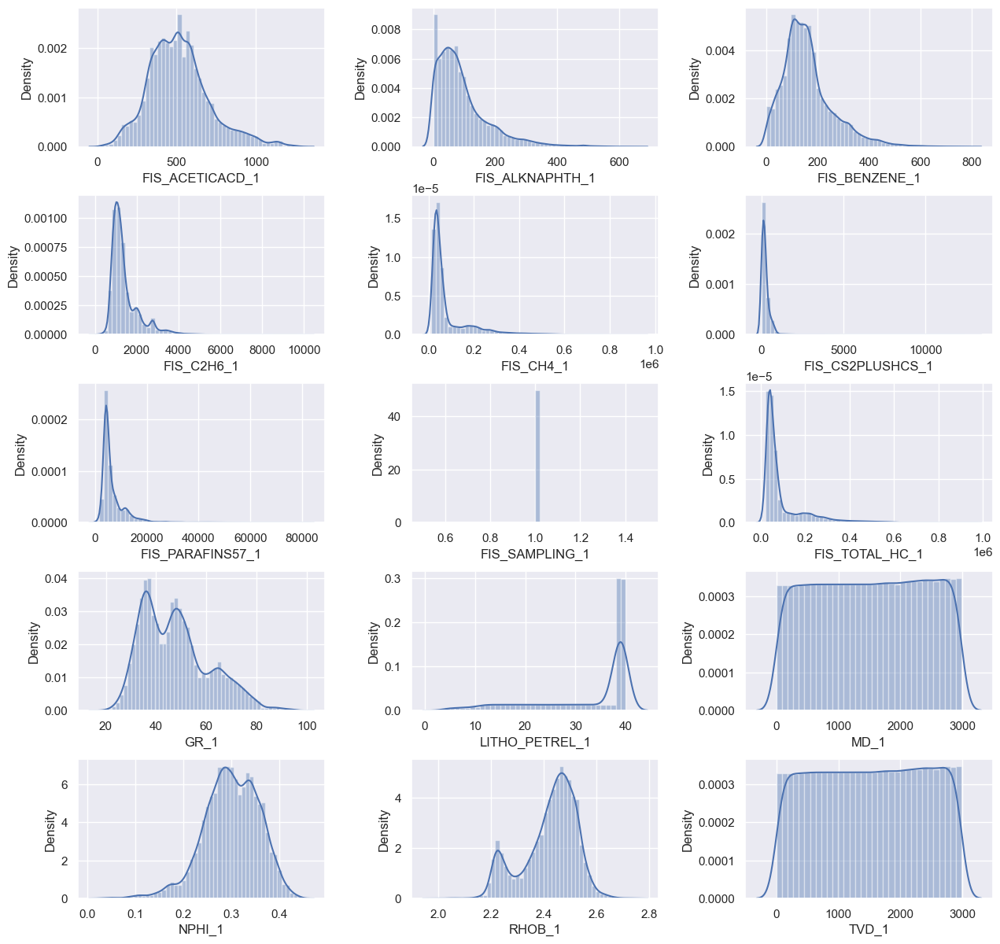

In [42]:
distribution_plot(m);  #Uncleaned data 

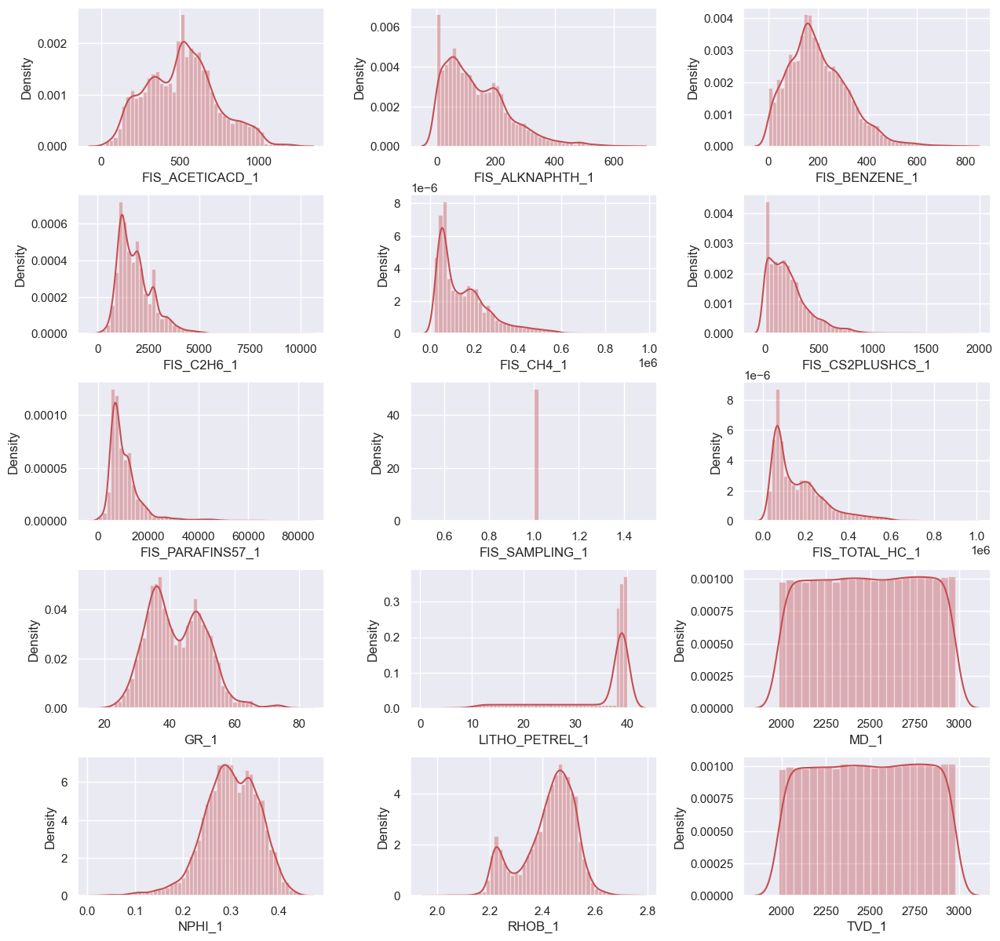

In [51]:
distribution_plot(l, color ='r');  #cleaned data 

#### Possible Outlier Detection using Box plots

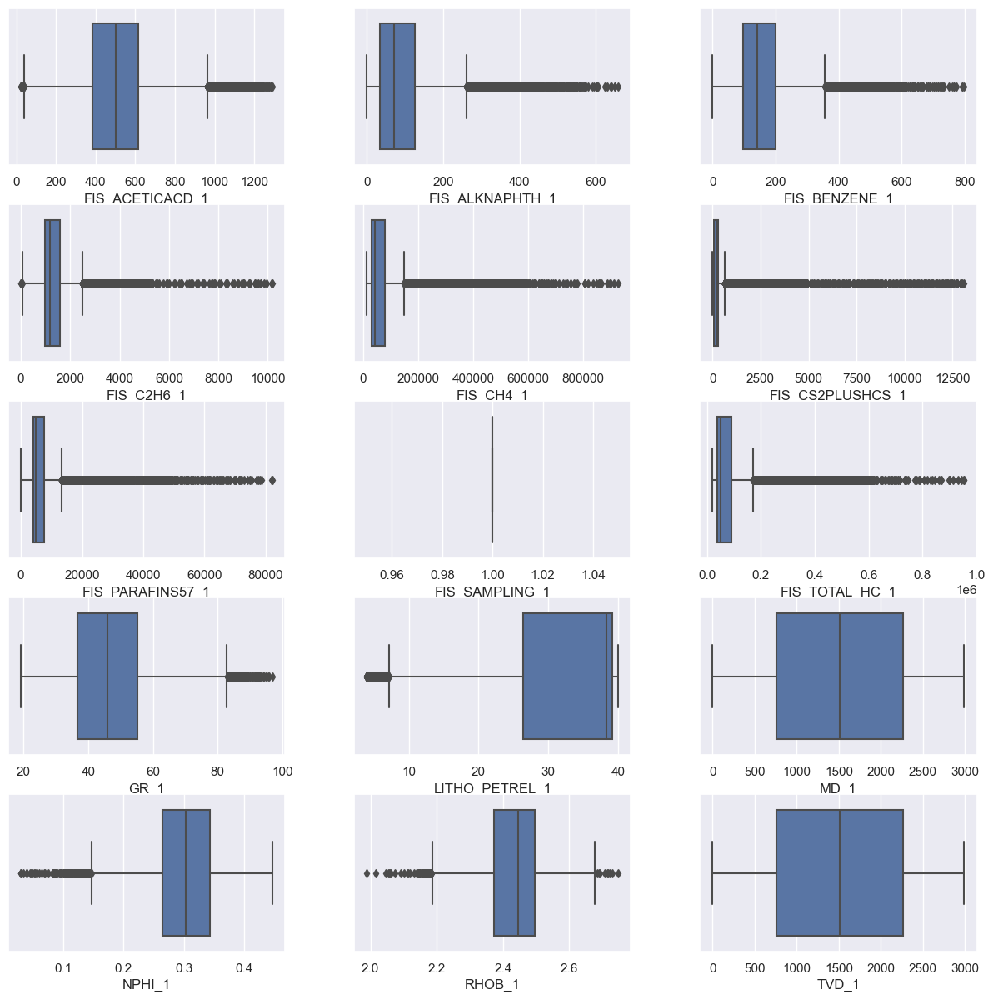

In [54]:
outliers(m) #uncleaned data 
#values> Q3+1.5IQR . IQR = Q3-Q1

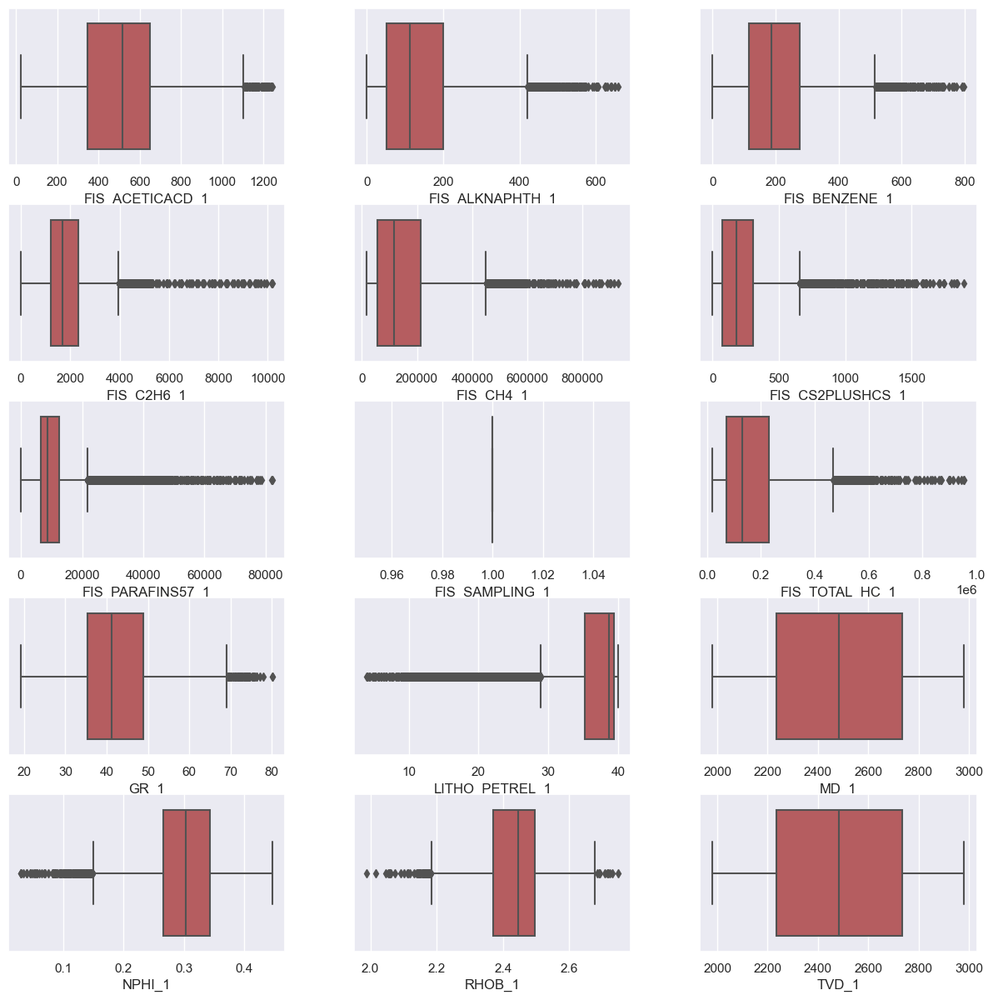

In [55]:
outliers(l,color = 'r') #cleand data

#### Bivariate Analysis 

In [70]:
# bivariate(m)      

In [71]:
all_col_names= m.columns.tolist()

In [72]:
print(all_col_names)

['FIS_ACETICACD_1', 'FIS_ALKNAPHTH_1', 'FIS_BENZENE_1', 'FIS_C2H6_1', 'FIS_CH4_1', 'FIS_CS2PLUSHCS_1', 'FIS_PARAFINS57_1', 'FIS_SAMPLING_1', 'FIS_TOTAL_HC_1', 'GR_1', 'LITHO_PETREL_1', 'MD_1', 'NPHI_1', 'RHOB_1', 'TVD_1']


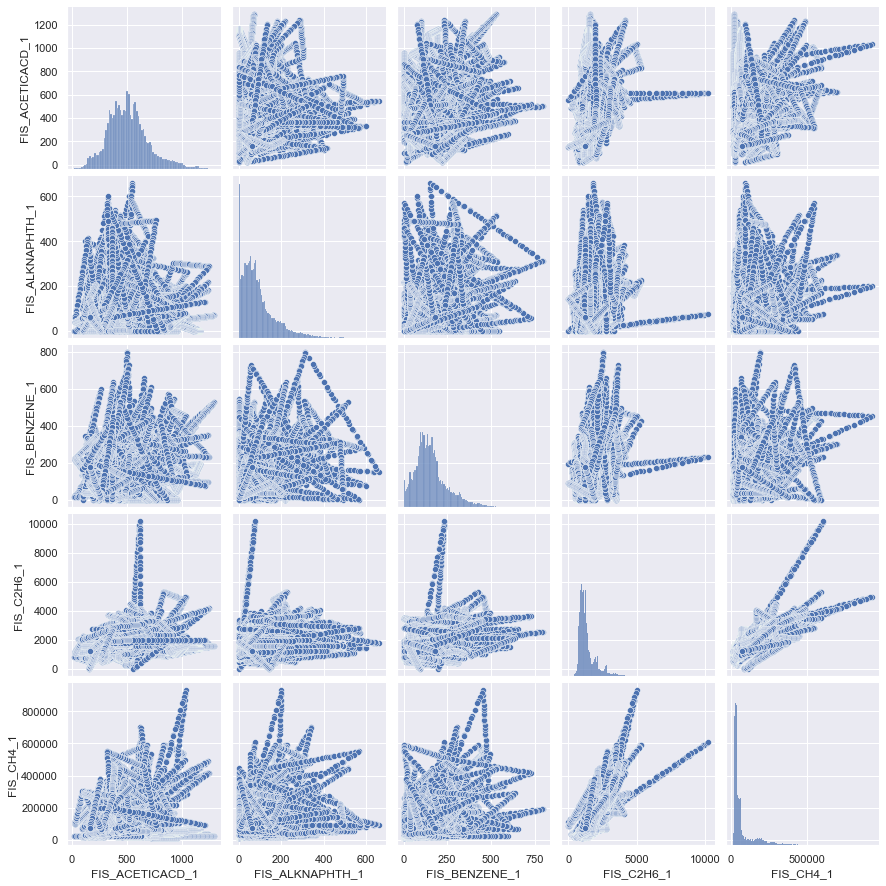

In [73]:
sns.pairplot(m[['FIS_ACETICACD_1', 'FIS_ALKNAPHTH_1', 'FIS_BENZENE_1', 'FIS_C2H6_1', 'FIS_CH4_1']]);

In [74]:
m.corr(method ='pearson')

,FIS_ACETICACD_1,FIS_ALKNAPHTH_1,FIS_BENZENE_1,FIS_C2H6_1,FIS_CH4_1,FIS_CS2PLUSHCS_1,FIS_PARAFINS57_1,FIS_SAMPLING_1,FIS_TOTAL_HC_1,GR_1,LITHO_PETREL_1,MD_1,NPHI_1,RHOB_1,TVD_1
FIS_ACETICACD_1,1.000000,-0.054510,0.191270,0.254307,0.191207,0.297684,-0.154547,NaN,0.181368,0.447275,-0.208767,0.052131,0.210708,-0.449732,0.052131
FIS_ALKNAPHTH_1,-0.054510,1.000000,0.276129,0.369836,0.352477,-0.070468,0.379264,NaN,0.368006,-0.419756,0.240664,0.371102,-0.191709,0.232000,0.371102
FIS_BENZENE_1,0.191270,0.276129,1.000000,0.441169,0.405689,0.238294,0.315139,NaN,0.422224,-0.297976,0.132797,0.320820,-0.139285,0.099685,0.320820
FIS_C2H6_1,0.254307,0.369836,0.441169,1.000000,0.836844,0.050613,0.346620,NaN,0.838850,-0.282199,0.147633,0.431764,-0.201566,0.098940,0.431764
FIS_CH4_1,0.191207,0.352477,0.405689,0.836844,1.000000,-0.032718,0.340071,NaN,0.994511,-0.304637,0.207645,0.548067,-0.320186,0.149901,0.548067
FIS_CS2PLUSHCS_1,0.297684,-0.070468,0.238294,0.050613,-0.032718,1.000000,-0.008394,NaN,-0.024429,0.139549,-0.124340,-0.031607,-0.074027,-0.005081,-0.031607
FIS_PARAFINS57_1,-0.154547,0.379264,0.315139,0.346620,0.340071,-0.008394,1.000000,NaN,0.393966,-0.446103,0.249466,0.538322,-0.201669,0.331625,0.538322
FIS_SAMPLING_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FIS_TOTAL_HC_1,0.181368,0.368006,0.422224,0.838850,0.994511,-0.024429,0.393966,NaN,1.000000,-0.329502,0.221473,0.568575,-0.328013,0.166738,0.568575
GR_1,0.447275,-0.419756,-0.297976,-0.282199,-0.304637,0.139549,-0.446103,NaN,-0.329502,1.000000,-0.411659,-0.851044,0.549444,-0.604117,-0.851044


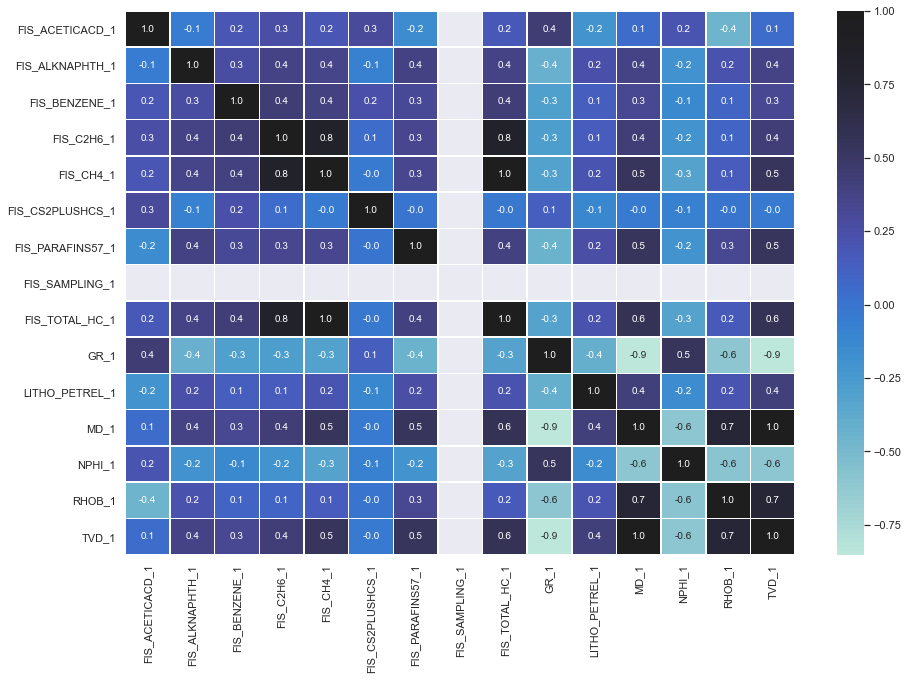

In [75]:
plt.figure(figsize=(15,10))
sns.heatmap(m.corr(method ='pearson'), annot=True, linewidths=.5, fmt= '.1f', center = 1)  # heatmap
plt.show()

### Pandas Profiling Report 

In [17]:
#Getting the pandas profiling report 
pandas_profiling.ProfileReport(l) 

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
#pip install pandas_profiling --upgrade